# Custom OCR - text recognition

# Importing the libraries

In [1]:
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
import imutils
from google.colab.patches import cv2_imshow

# Loading the neural network

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [45]:
network = load_model('/content/drive/MyDrive/Model/modelOCR.h5')
network.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 13, 13, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 13, 13, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 6, 6, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 4, 4, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 2, 2, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 36)                  │           4,644 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 138,470 (540.90 KB)

 Trainable params: 138,468 (540.89 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

# Loading the test image

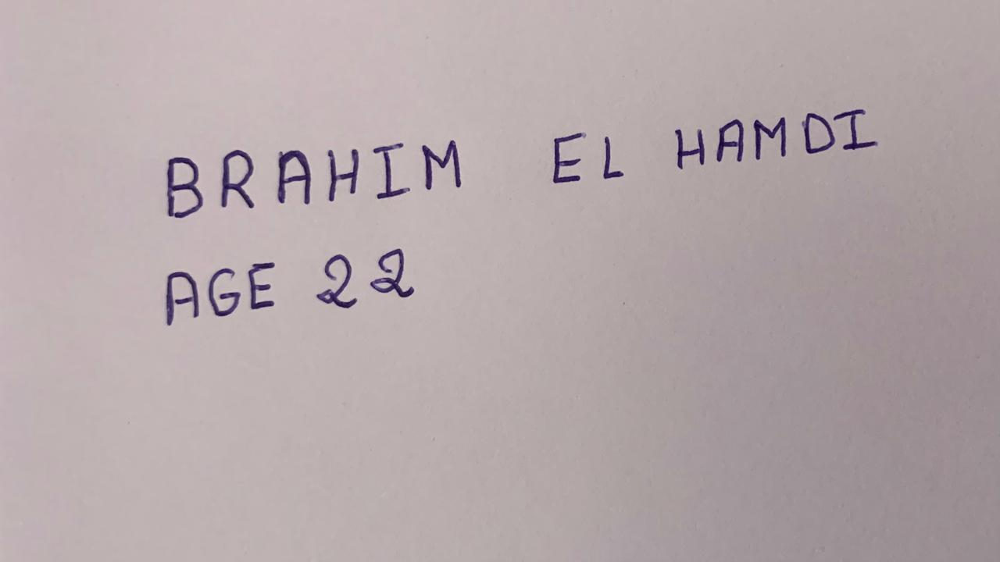

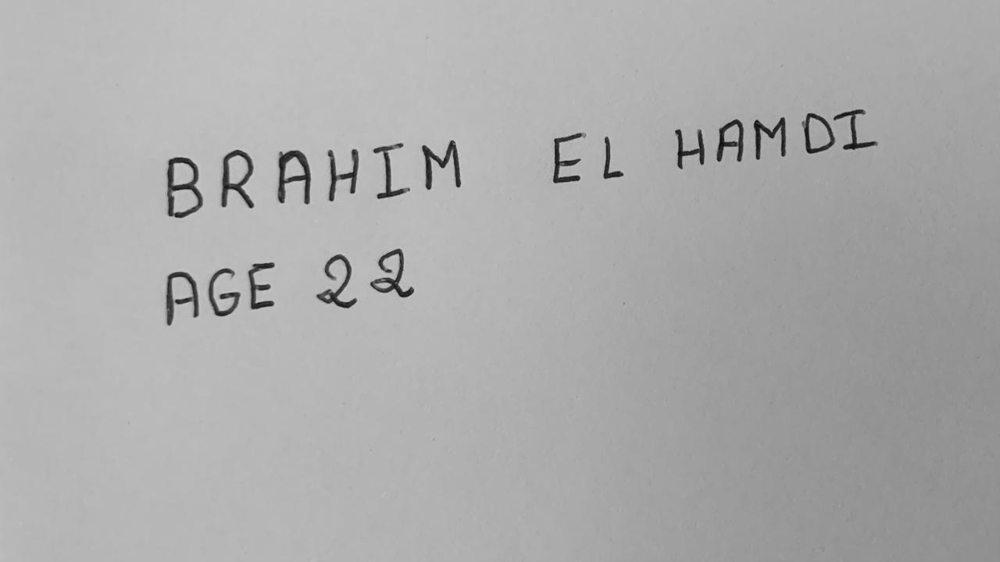

In [11]:
img = cv2.imread('/content/TestingOCRenglishFinal.jpg')
cv2_imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

# Pre-processing the image

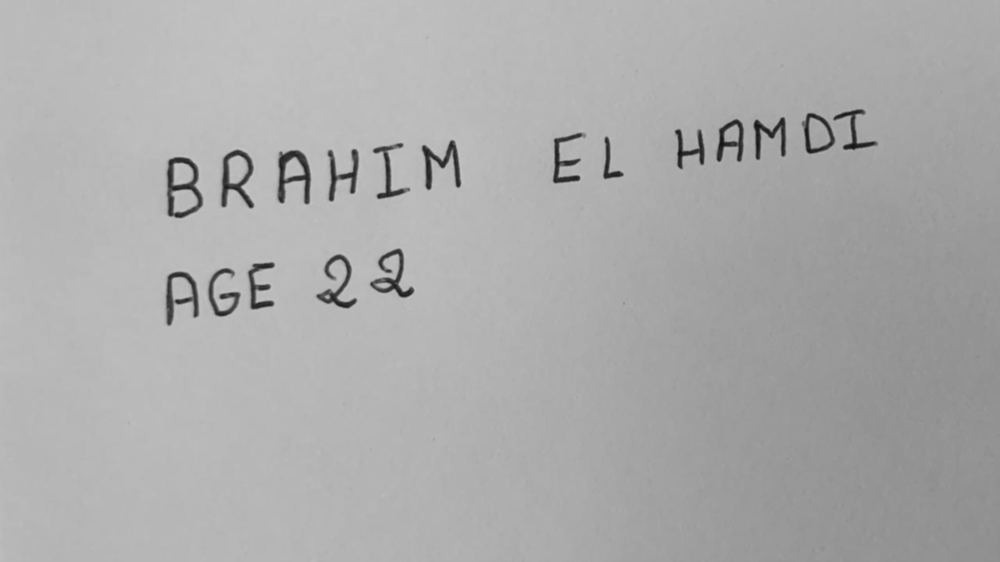

In [12]:
blur = cv2.GaussianBlur(gray, (3,3), 0)
cv2_imshow(blur)

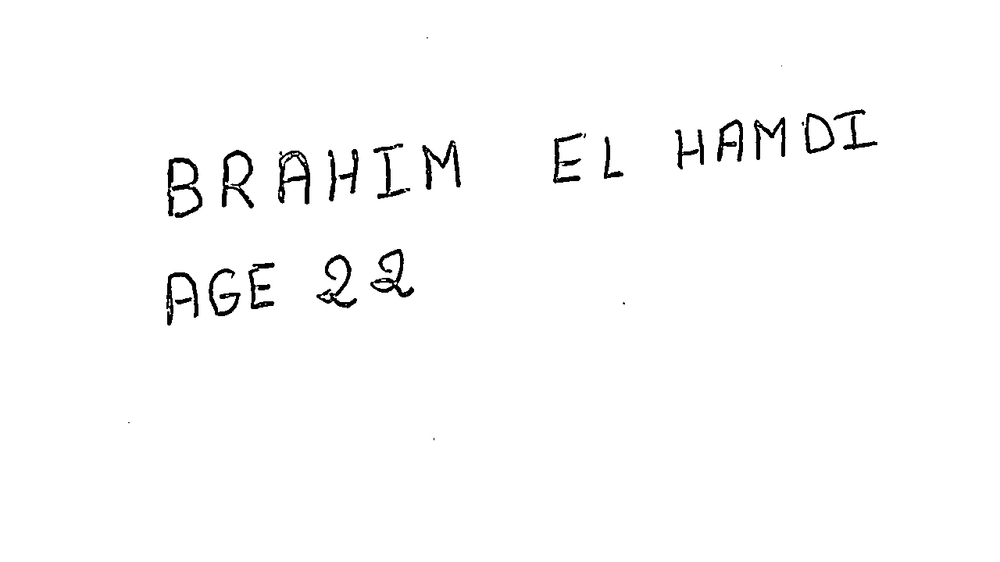

In [13]:
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
cv2_imshow(adaptive)

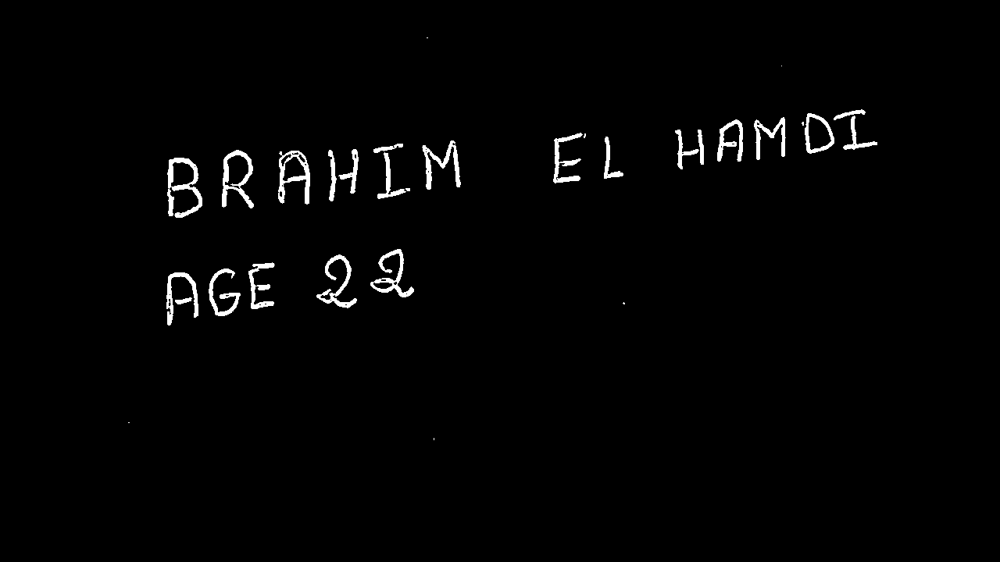

In [14]:
invertion = 255 - adaptive
cv2_imshow(invertion)

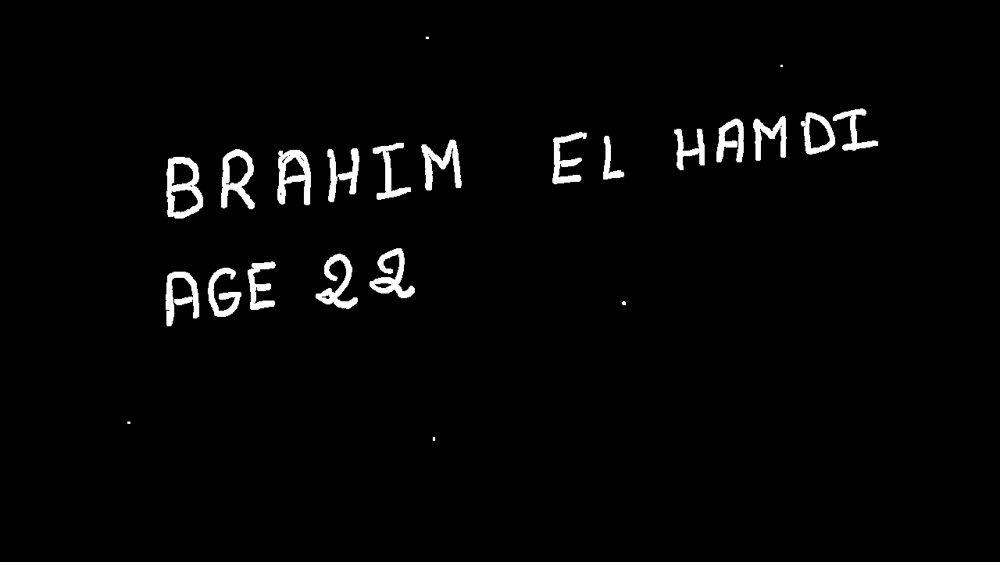

In [15]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
cv2_imshow(dilation)

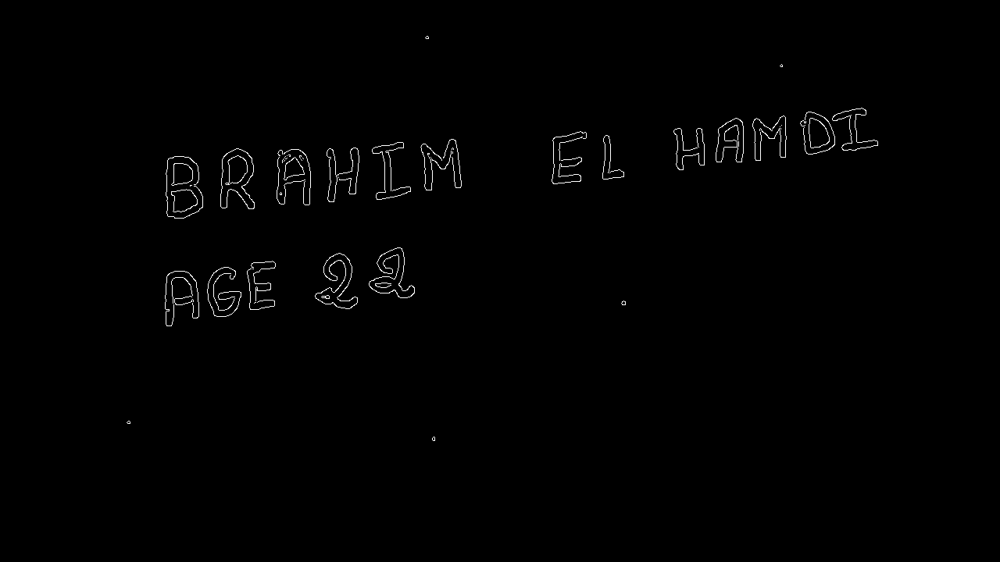

In [16]:
edges = cv2.Canny(dilation, 40, 150)
cv2_imshow(edges)

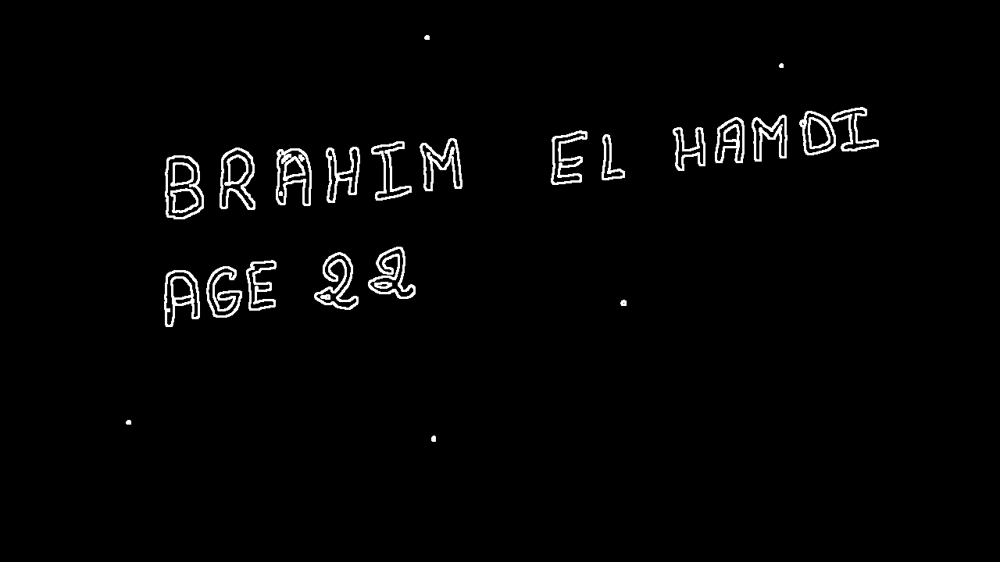

In [17]:
dilation = cv2.dilate(edges, np.ones((3,3)))
cv2_imshow(dilation)

# Contour detection

In [18]:
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method = 'left-to-right')[0]
  return conts

In [19]:
conts = find_contours(dilation.copy())

In [20]:
conts

(array([[[163, 538]],
 
        [[161, 540]],
 
        [[161, 542]],
 
        [[162, 543]],
 
        [[167, 543]],
 
        [[167, 539]],
 
        [[166, 538]]], dtype=int32),
 array([[[222, 346]],
 
        [[221, 347]],
 
        [[220, 347]],
 
        [[219, 348]],
 
        [[217, 348]],
 
        [[216, 349]],
 
        [[215, 349]],
 
        [[213, 351]],
 
        [[213, 352]],
 
        [[212, 353]],
 
        [[212, 361]],
 
        [[211, 362]],
 
        [[211, 376]],
 
        [[210, 377]],
 
        [[210, 383]],
 
        [[211, 384]],
 
        [[211, 385]],
 
        [[210, 386]],
 
        [[210, 396]],
 
        [[211, 397]],
 
        [[211, 416]],
 
        [[212, 417]],
 
        [[212, 418]],
 
        [[220, 418]],
 
        [[220, 417]],
 
        [[221, 416]],
 
        [[221, 413]],
 
        [[222, 412]],
 
        [[222, 408]],
 
        [[223, 407]],
 
        [[223, 392]],
 
        [[224, 391]],
 
        [[234, 391]],
 
        [[235, 390]],
 
   

# Pre-processing the image

In [21]:
def preprocess_image(image, kernel_height):
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(img_gray, (3,3), 0)
    ret, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY_INV)
    kernel = np.ones((5, kernel_height), np.uint8)
    dilated = cv2.dilate(thresh, kernel, iterations=1)
    cv2_imshow(dilated)
    contours, hierarchy = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    sorted_contours_lines = sorted(contours, key=lambda ctr: cv2.boundingRect(ctr)[1])
    img_with_boxes = image.copy()
    line_list = []
    min_h, max_h = 60, 200
    for ctr in sorted_contours_lines:
        x, y, w, h = cv2.boundingRect(ctr)
        if min_h <= h <= max_h:
            cv2.rectangle(img_with_boxes, (x, y), (x + w, y + h), (40, 100, 250), 2)
            line_list.append([x, y, x + w, y + h])
    cv2_imshow(img_with_boxes)
    return line_list

In [22]:
def find_contours(img):
    conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    conts = imutils.grab_contours(conts)
    conts = sort_contours(conts, method='left-to-right')[0]
    return conts

In [23]:
def extract_roi(img, x, y, w, h, margin=2):
    roi = img[y - margin:y + h, x - margin:x + w + margin]
    return roi

In [24]:
def thresholding(roi):
    return cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

In [46]:
def resize_img(thresh):
    return cv2.resize(thresh, (28, 28))

In [26]:
def normalization(img):
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=-1)
    return img

# image segmentation into lines

In [27]:
def process_box(gray, x, y, w, h):
    roi = extract_roi(gray, x, y, w, h)
    thresh = thresholding(roi)
    resized = resize_img(thresh)
    cv2_imshow(resized)
    normalized = normalization(resized)
    characters.append((normalized, (x, y, w, h)))

In [28]:
def detect_characters_within_lines(image, lines, gray_img):
    min_w, max_w = 10, 160
    min_h, max_h = 20, 140

    for line in lines:
        x1, y1, x2, y2 = line
        roi = gray_img[y1:y2, x1:x2]
        adaptive = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
        invertion = 255 - adaptive
        dilation = cv2.dilate(invertion, np.ones((3,3), np.uint8))
        conts = find_contours(dilation)

        for c in conts:
            (x, y, w, h) = cv2.boundingRect(c)
            if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
                process_box(gray_img, x1 + x, y1 + y, w, h)

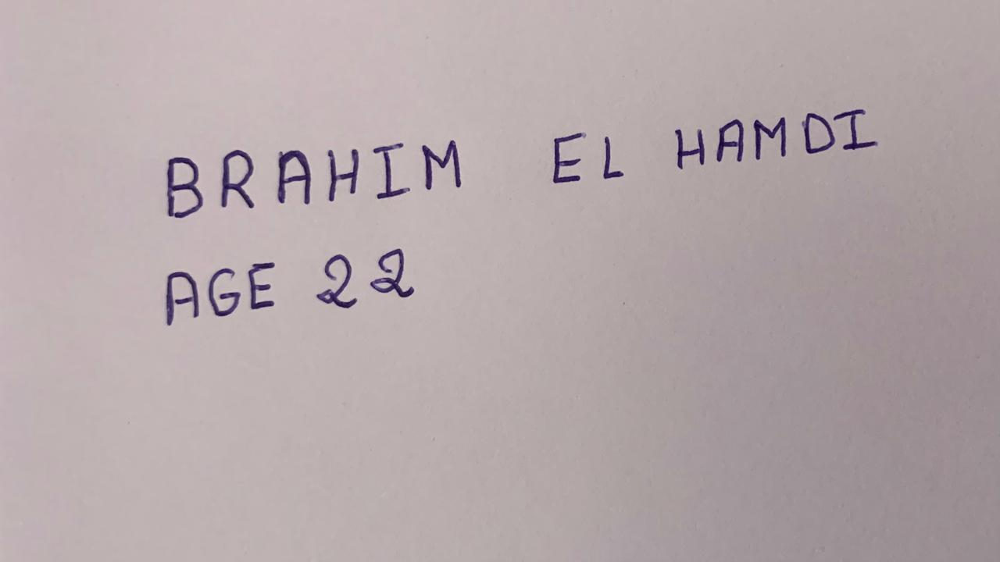

In [47]:
# Loading the test image
img = cv2.imread('/content/TestingOCRenglishFinal.jpg')
cv2_imshow(img)

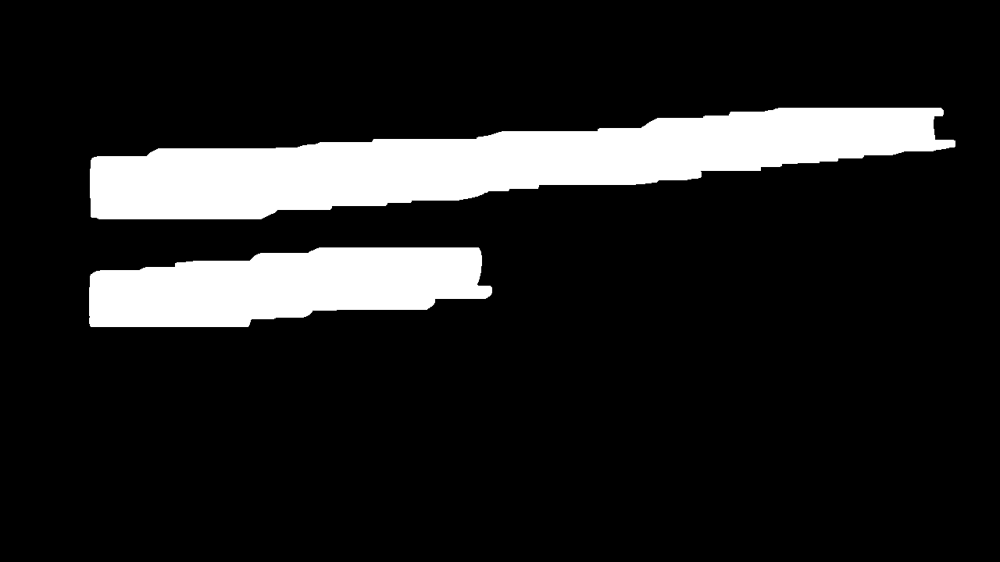

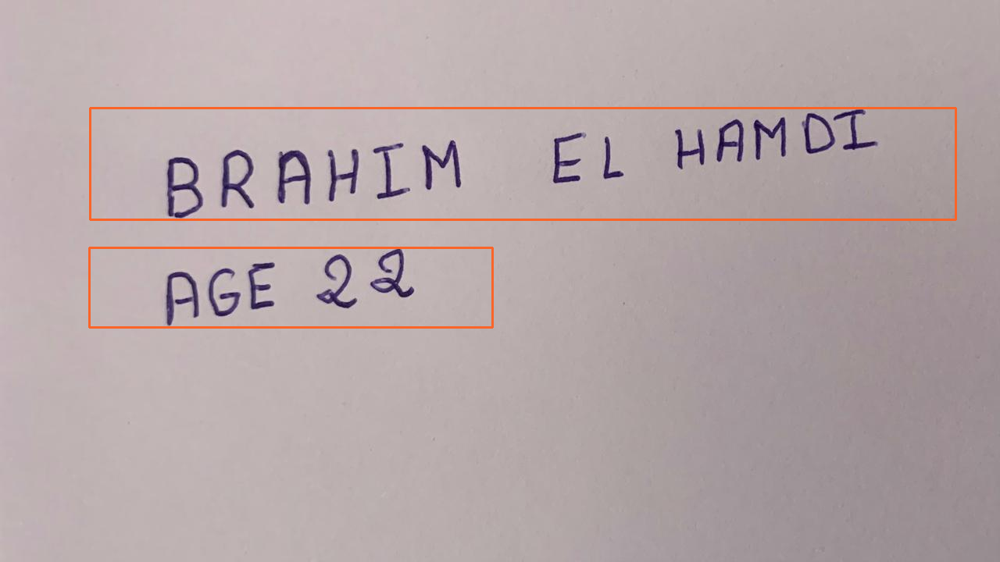

In [48]:
# Get the list of bounding box coordinates for lines
line_list = preprocess_image(img, 200)

In [49]:
# Convert image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray

array([[187, 187, 187, ..., 174, 173, 172],
       [187, 187, 187, ..., 174, 173, 172],
       [187, 187, 187, ..., 173, 172, 172],
       ...,
       [186, 186, 186, ..., 143, 143, 143],
       [186, 186, 186, ..., 143, 143, 143],
       [186, 186, 186, ..., 143, 143, 143]], dtype=uint8)

In [50]:
# Processing the detections
characters = []
detect_characters_within_lines(img, line_list, gray)

In [51]:
# Normalize the detections and prepare for recognition
boxes = [box[1] for box in characters]
pixels = np.array([pixel[0] for pixel in characters], dtype='float32')

In [52]:
# Recognition of characters
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNORQRSTUNWXYZ'
characters_list = digits + letters
characters_list = [l for l in characters_list]

predictions = network.predict(pixels)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step


# Recognition of characters

B  ->  98.58192205429077


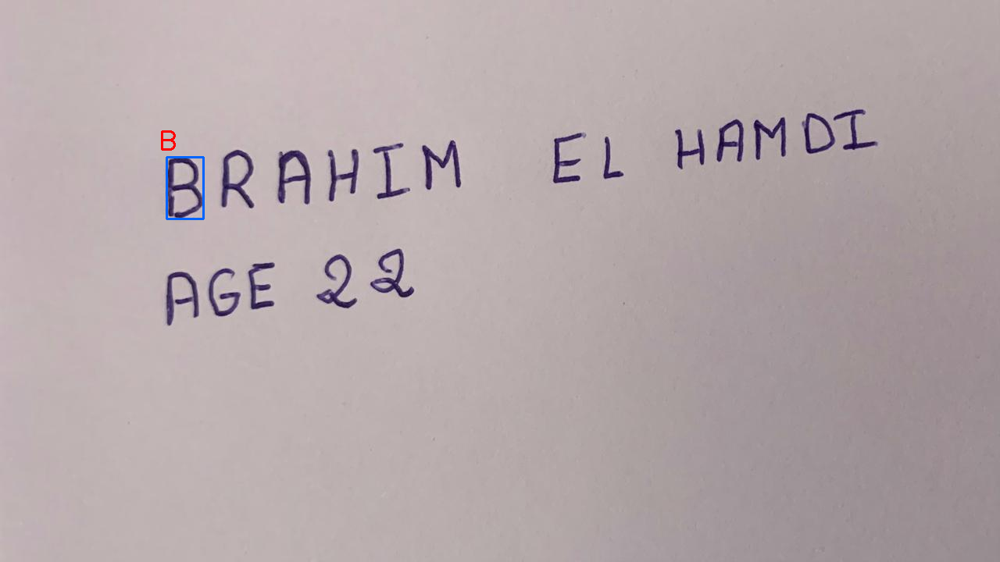

R  ->  49.514177441596985


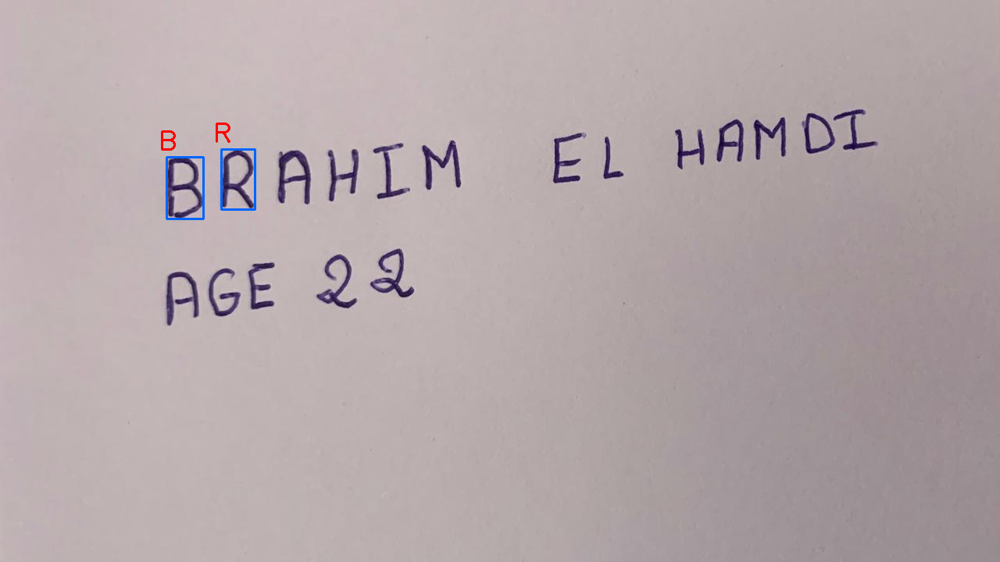

A  ->  99.99957084655762


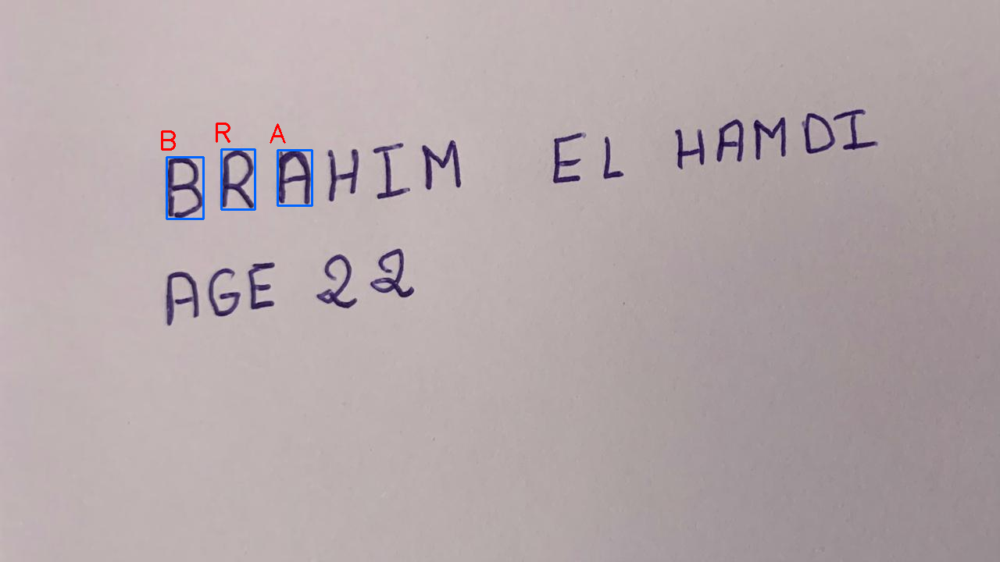

H  ->  99.94472861289978


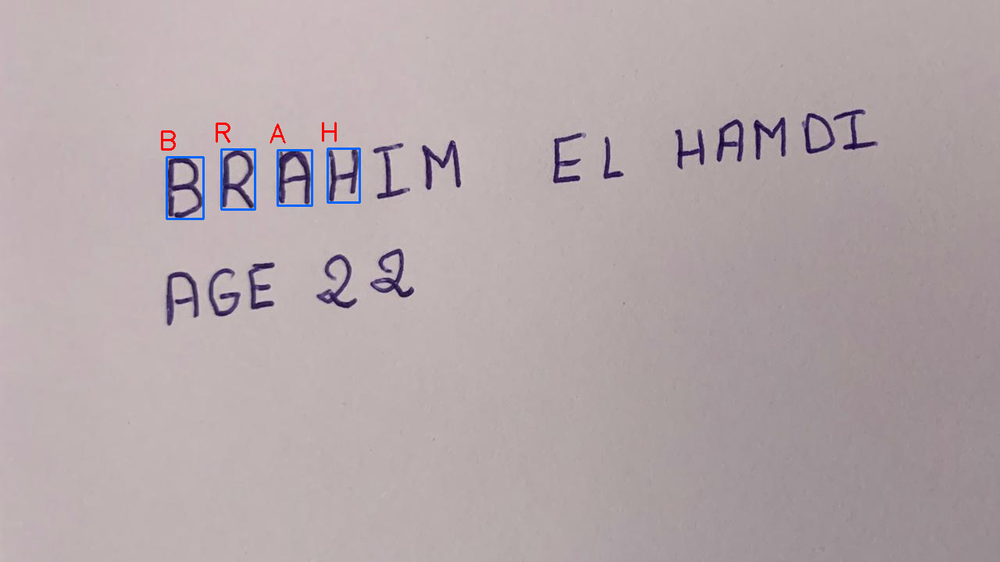

I  ->  100.0


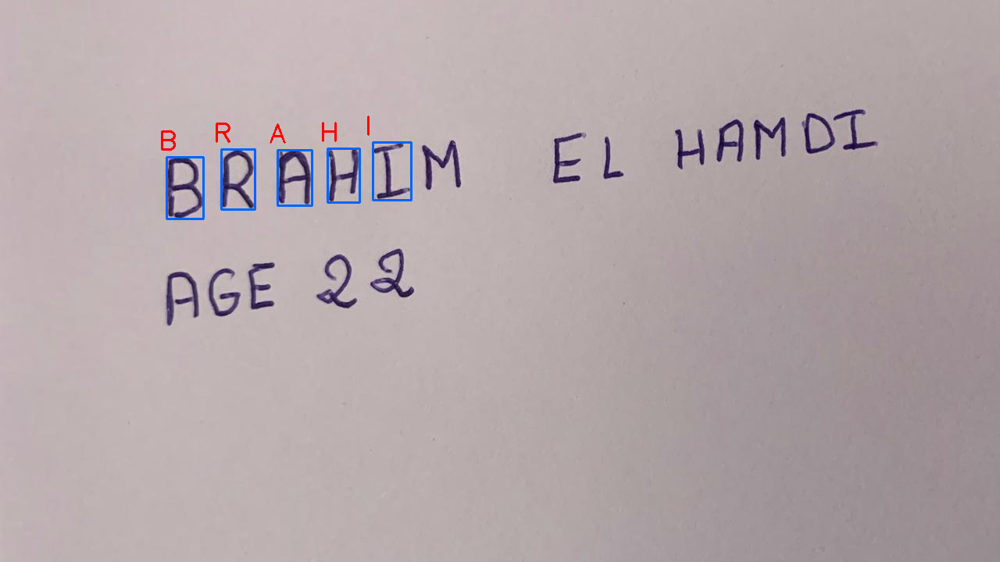

M  ->  99.80809688568115


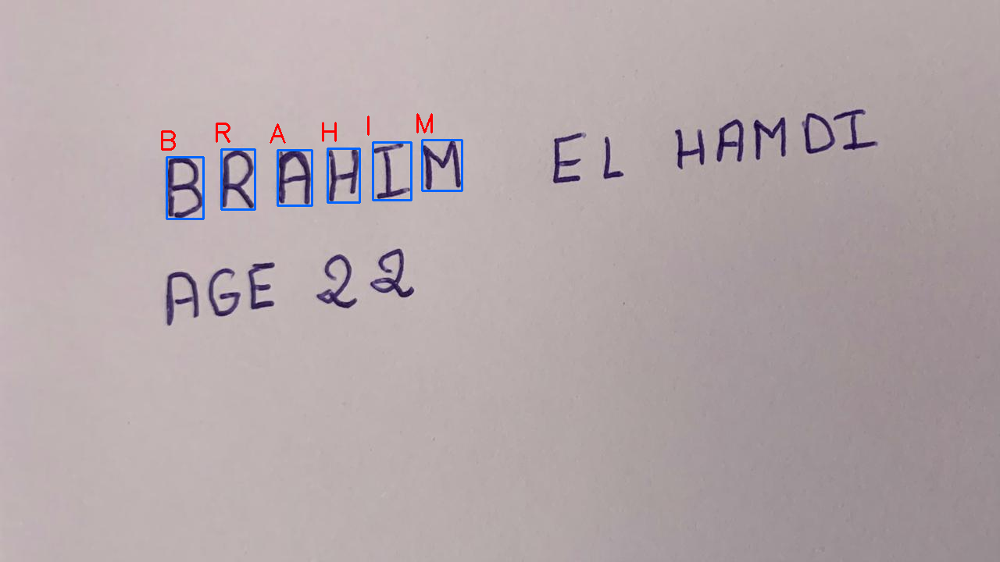

E  ->  99.9940276145935


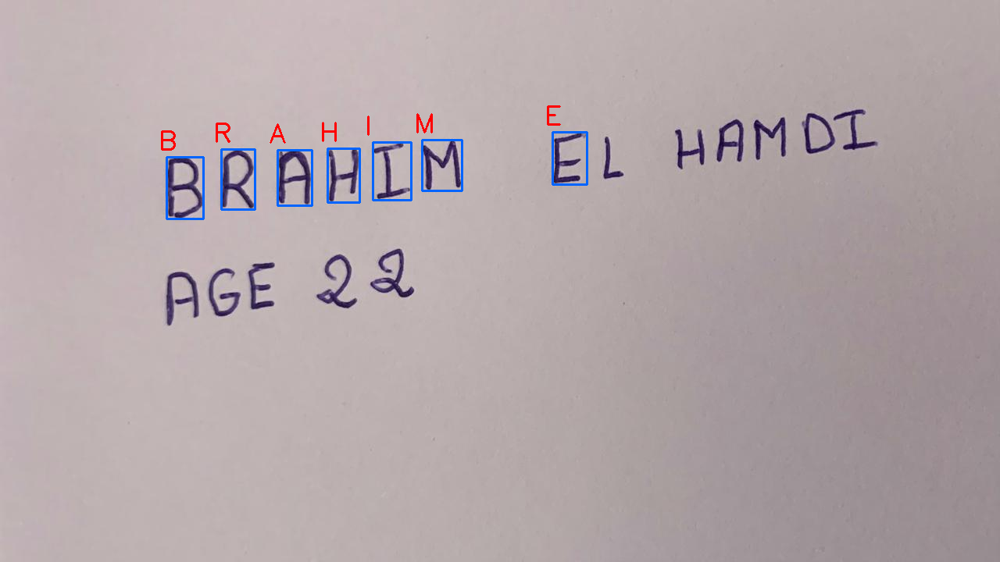

L  ->  99.9903917312622


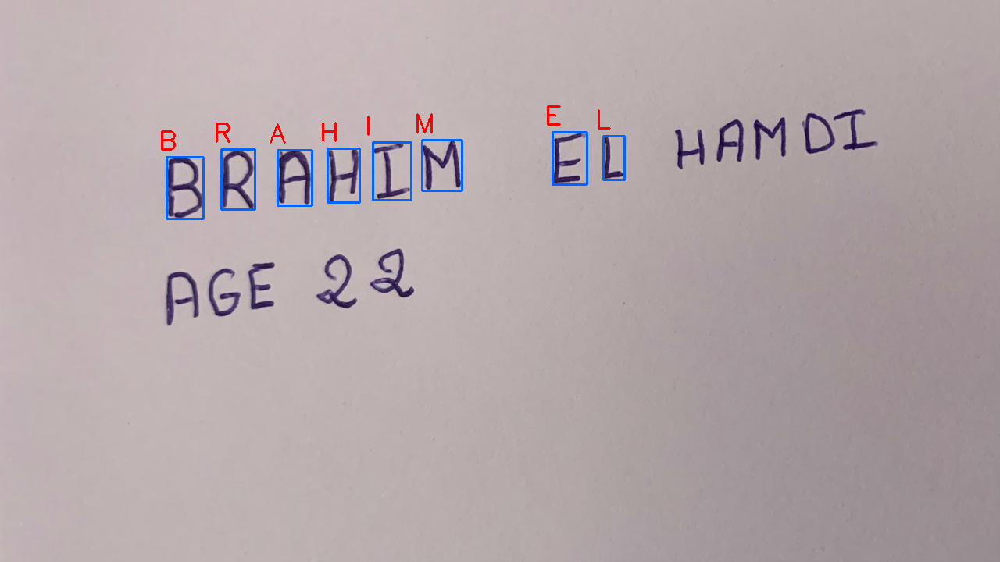

H  ->  99.99231100082397


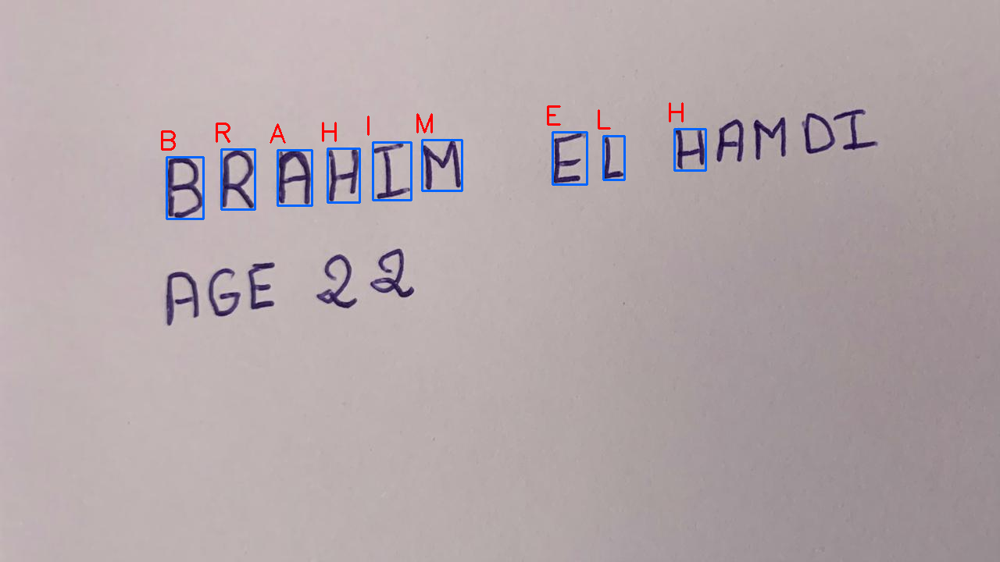

A  ->  99.97883439064026


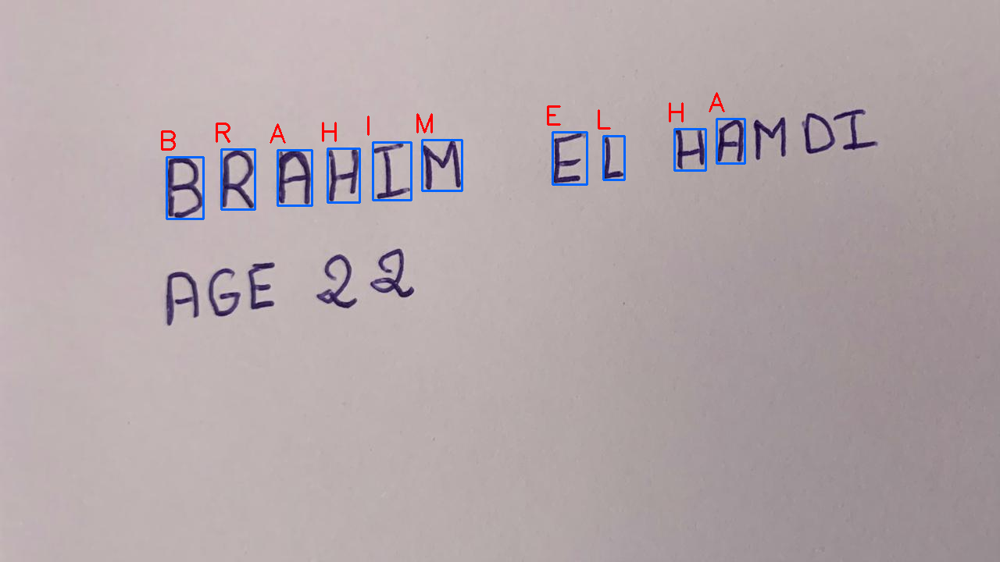

M  ->  96.74757719039917


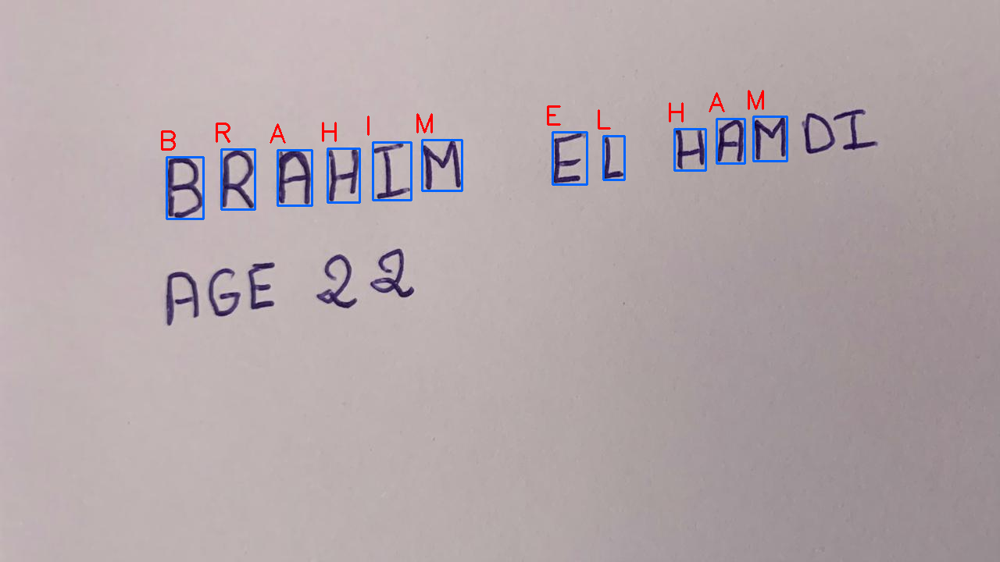

D  ->  99.93366599082947


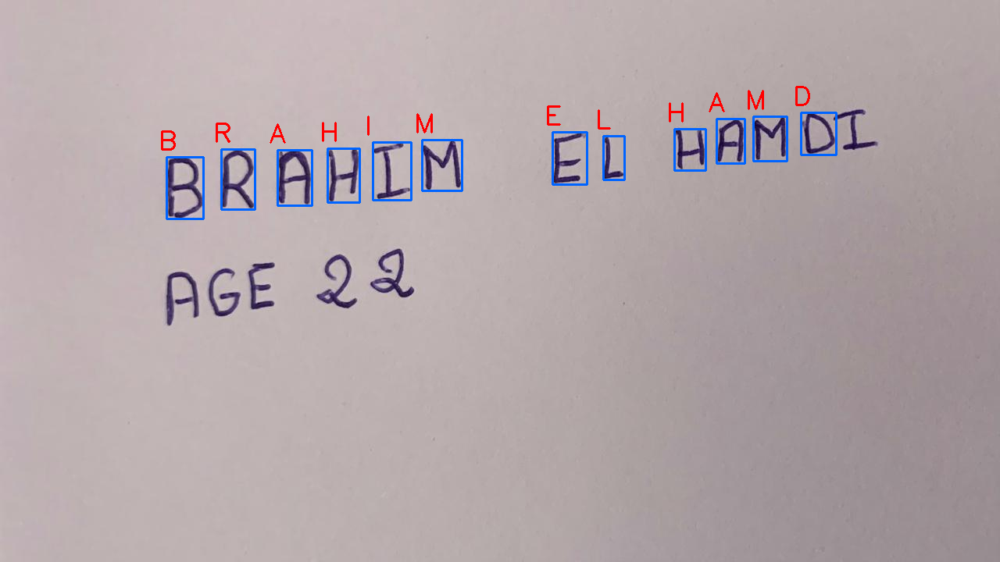

I  ->  99.99819993972778


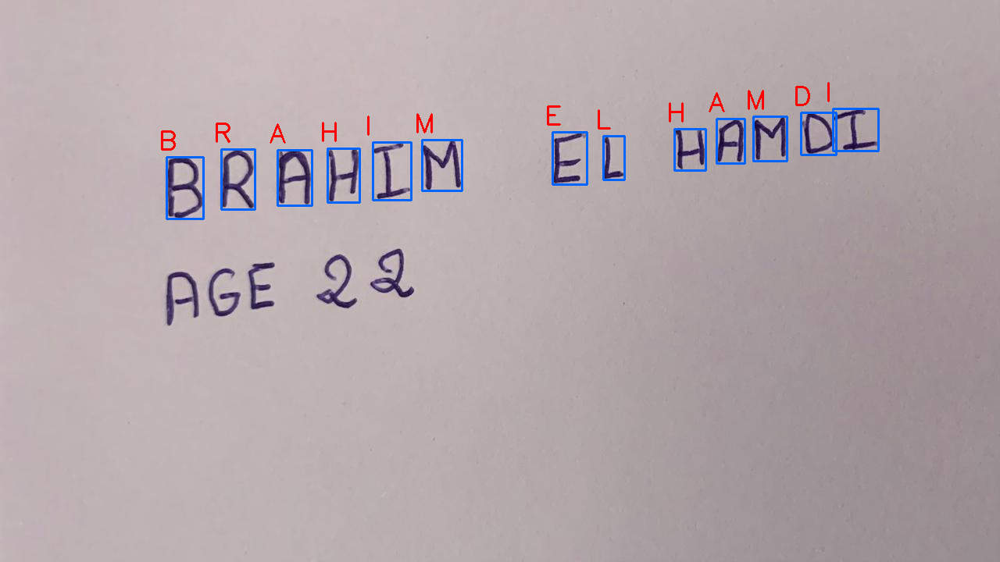

A  ->  99.98701810836792


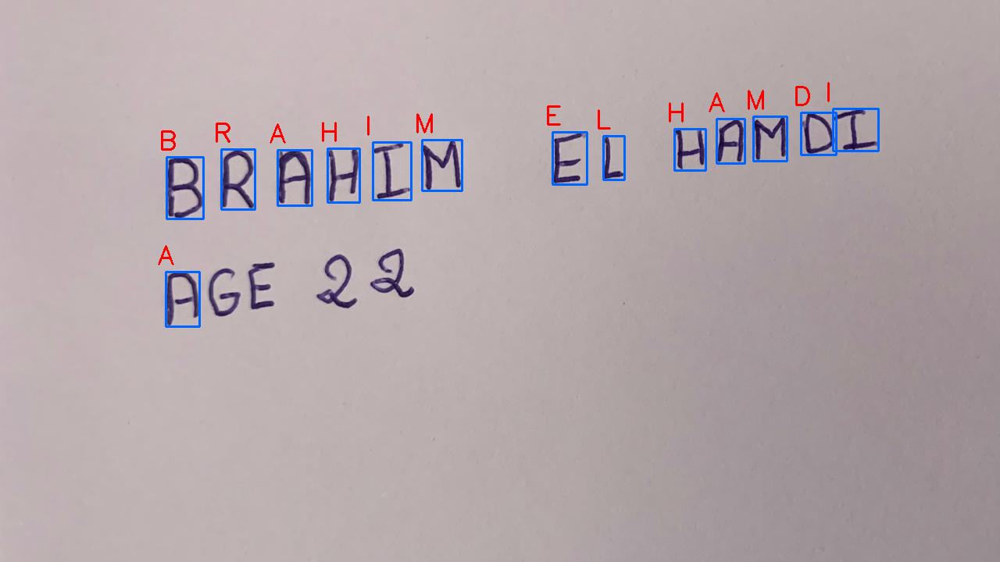

G  ->  99.99886751174927


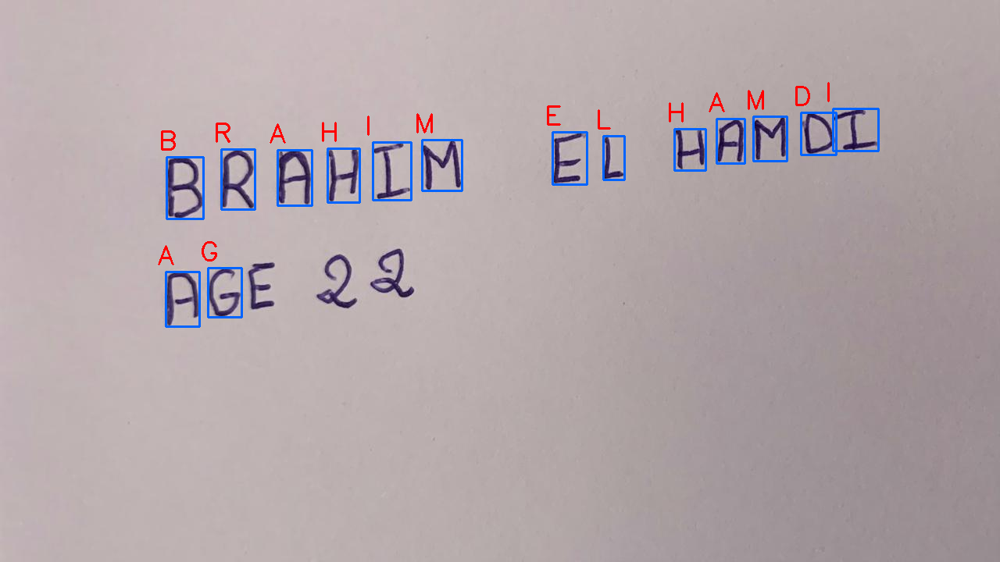

E  ->  99.61841702461243


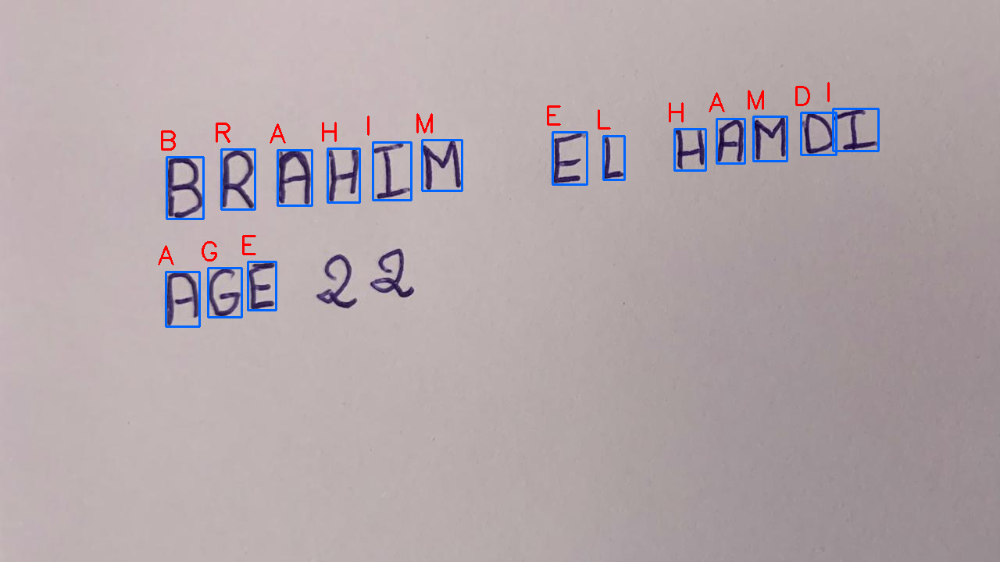

2  ->  99.99940395355225


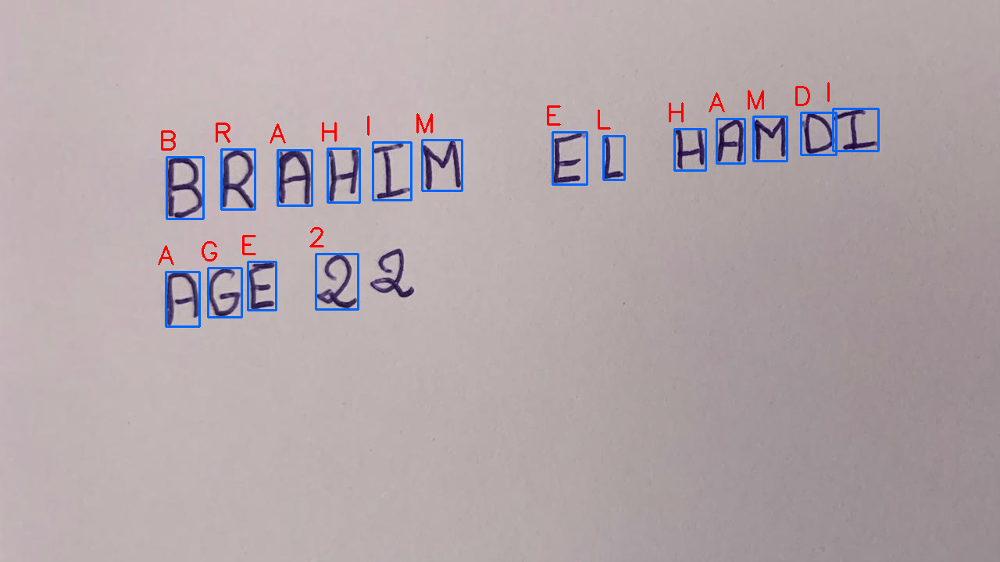

2  ->  99.43333864212036


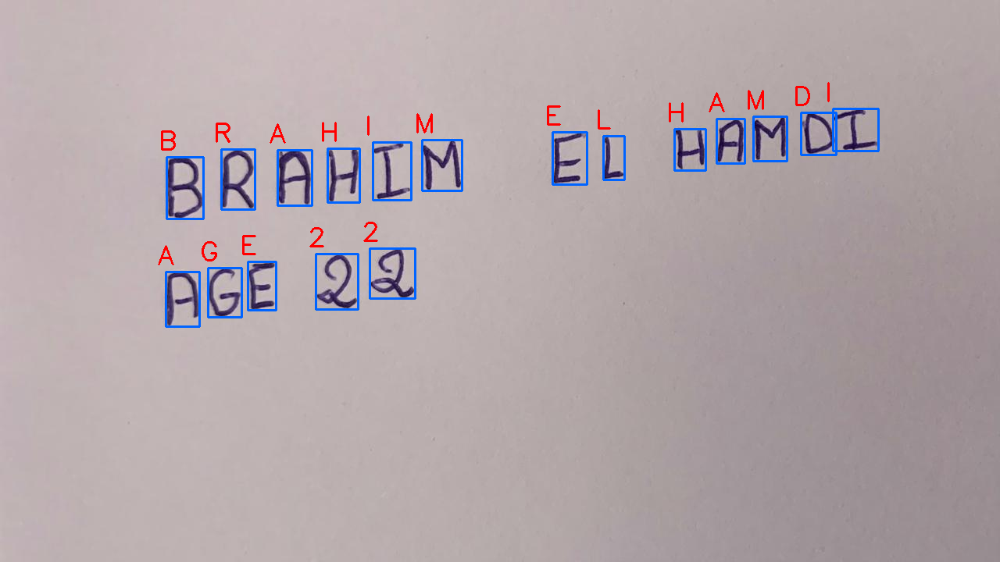

BRAHIM EL HAMDI
AGE 22


In [53]:
img_copy = img.copy()
text = ""
previous_end_x = None
previous_y = None

# Calculate the average width of the characters
average_width = np.mean([w for (x, y, w, h) in boxes])

# Define a threshold for space based on the average width
space_threshold = average_width * 0.7

# Define a threshold for detecting new lines
line_threshold = average_width * 2

for (prediction, (x, y, w, h)) in zip(predictions, boxes):
    i = np.argmax(prediction)
    probability = prediction[i]
    character = characters_list[i]

    if previous_end_x is not None:
        # Calculate the distance between the current character's start x and the previous character's end x
        distance = x - previous_end_x

        # Add a space if the distance exceeds the space threshold
        if distance > space_threshold:
            text += " "

        # Add a newline if the current character is in a new line
        if abs(y - previous_y) > line_threshold:
            text += "\n"

    text += character
    previous_end_x = x + w  # Update to the end x of the current character's bounding box
    previous_y = y  # Update to the y of the current character's bounding box

    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 100, 0), 2)
    cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)
    print(character, ' -> ', probability * 100)

    cv2_imshow(img_copy)

print(text)
